<h1 style="font-size:30px;">Download Pretrained model and Finetune </h1>

This notebook discusses the training process of TFOD API with a pretrained model and finetune it.

In [ ]:
!apt install cuda-11-8

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  cuda-cccl-11-8 cuda-command-line-tools-11-8 cuda-compiler-11-8 cuda-cudart-11-8
  cuda-cudart-dev-11-8 cuda-cuobjdump-11-8 cuda-cupti-11-8 cuda-cupti-dev-11-8 cuda-cuxxfilt-11-8
  cuda-demo-suite-11-8 cuda-documentation-11-8 cuda-driver-dev-11-8 cuda-gdb-11-8
  cuda-libraries-11-8 cuda-libraries-dev-11-8 cuda-memcheck-11-8 cuda-nsight-11-8
  cuda-nsight-compute-11-8 cuda-nsight-systems-11-8 cuda-nvcc-11-8 cuda-nvdisasm-11-8
  cuda-nvml-dev-11-8 cuda-nvprof-11-8 cuda-nvprune-11-8 cuda-nvrtc-11-8 cuda-nvrtc-dev-11-8
  cuda-nvtx-11-8 cuda-nvvp-11-8 cuda-profiler-api-11-8 cuda-runtime-11-8 cuda-sanitizer-11-8
  cuda-toolkit-11-8 cuda-toolkit-11-8-config-common cuda-toolkit-11-config-common cuda-tools-11-8
  cuda-visual-tools-11-8 gds-tools-11-8 libcublas-11-8 libcublas-dev-11-8 libcufft-11-8
  libcufft-dev-11-8 libcufile-11-8 libcufile-dev-

In [ ]:
!export CUDA_PATH=/usr/local/cuda-11.8/

### RESTART RUNTIME

In [ ]:
!nvidia-smi

Mon Feb 12 11:39:18 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Table of Contents

* [1 Installing TensorFlow Object Detection API](#1-Installing-TensorFlow-Object-Detection-API)
* [2 Data Preperation](#2-Data-Preperation)
* [3 Generate a LabelMap File](#3-Generate-a-LabelMap-File)
* [4 Generate TF Records](#4-Generate-TF-Records)
* [5 Visualize the Dataset from TF Records](#5-Visualize-the-Dataset-from-TF-Records)
* [6 Download and Train Faster RCNN (with ResNet101 as the feature extractor)](#6-Download-and-Train-Faster-RCNN-%28with-ResNet101-as-the-feature-extractor%29)

## 1 Installing TensorFlow Object Detection API

**Update `pip`**

In [ ]:
!pip install --upgrade pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 16.6 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2


In [ ]:
# You need to update OpenCV if you are using Colab.
# Uncomment this line if you are using Colab.
!pip install opencv-python --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 11.3 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.8.0.76
    Uninstalling opencv-python-4.8.0.76:
      Successfully uninstalled opencv-python-4.8.0.76


In [ ]:
# !apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2

**Clone the GitHub Repo**

Here we will clone the TFOD API repo.

In [ ]:
import os

if not 'models' in os.listdir():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4067, done.
remote: Counting objects: 100% (4067/4067), done.
remote: Compressing objects: 100% (3043/3043), done.
remote: Total 4067 (delta 1179), reused 2919 (delta 964), pack-reused 0
Receiving objects: 100% (4067/4067), 44.58 MiB | 26.43 MiB/s, done.
Resolving deltas: 100% (1179/1179), done.


#### **COCO API Installation**

This is used when we're evaluating the model. This let's us use coco metrics for evaluation

In [ ]:
# Install PyCocoTools
!pip install pycocotools

In [ ]:
# The `%%bash` magic command inside a notebook lets you run a cell run like a shell interface
# Note: the `bash` command works only on Colab.
%%bash

# Change the directory to models/research
cd models/research/

# Compile the API's Protobuf files
protoc object_detection/protos/*.proto --python_out=.

# Copy the required Setup file
cp object_detection/packages/tf2/setup.py .

# Install the API using the setup.py file
python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.0/152.0 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py)

In [ ]:
!pip install -U tensorflow==2.13.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.1/524.1 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 71.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 99.8 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.9.0
    Uninstalling typing_extensions-4.9.0:
      Successfully uninstalled typing_extensions-4.9.0
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0
    Uninstalling tensorflow-estimator-2.15.0:
      Successfully uninstalled tensorflow-estimator-2.15.0
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.6.1
    Uninstalling tensorboard-data-server-0.6.1:
      Successfully uninstalled tensorboa

### RESTART RUNTIME

In [ ]:
# Test the API if everything was installed correctly
!python models/research/object_detection/builders/model_builder_tf2_test.py

2024-02-12 11:52:53.155393: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-12 11:52:54.724980: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-02-12 11:52:58.527908: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-12 11:52:59.176443: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returnin

Looks like our TFOD API is running great

**Import required libraries**

In [ ]:
from zipfile import ZipFile
import urllib
import tarfile
import requests

import sys
import cv2

import matplotlib
import matplotlib.pyplot as plt

import numpy as np
import tensorflow as tf

## 2 Data Preparation

We have already covered on how to prepare the data (download the dataset and converting into tf records) in our previous notebook

### 2.1 Download the Dataset

In [ ]:
def download_file(url, save_name):
    url = url
    file = requests.get(url)

    open(save_name, 'wb').write(file.content)

In [ ]:
def unzip(zip_file=None):
    try:
        with ZipFile(zip_file) as z:
            z.extractall("./")
            print("Extracted all")
    except:
        print("Invalid file")

In [ ]:
# Download the PASCAL VOC subset data.
download_file(
                  'https://www.dropbox.com/s/415tmokwg5xkw99/pascal_voc_subset_data.zip?dl=1',
                  'pascal_voc_subset_data.zip'
                 )

We have downloaded the the dataset and now we will extract it.

In [ ]:
unzip(zip_file='pascal_voc_subset_data.zip')

Extracted all


### 2.2 Download and Extract Utility Scripts

In [ ]:
import os

In [ ]:
if not os.path.exists('tfod_utils'):
    download_file(
                  'https://www.dropbox.com/sh/i5uds5hgzc0phik/AADHAlWQk7VmTSFtoWj9pBZJa?dl=1',
                  'tfod_utils_pascal_voc_subset.zip'
                 )
    unzip(zip_file='tfod_utils_pascal_voc_subset.zip')

## 3 Generate a LabelMap File

In [ ]:
# Create Label Map of the Dataset
pbtxt = '''
item {
    name: 'car',
    id: 1,
}

item {
    name: 'dog',
    id: 2,
}

item {
    name: 'person',
    id: 3,
}

item {
    name: 'tvmonitor',
    id: 4,
}
'''

# Save this labelmap to disk
with open("labelmap.pbtxt", "w") as text_file:
    text_file.write(pbtxt)

## 4 Generate TF Records

In [ ]:
# create tf_record for train data
!python ./tfod_utils/xml_to_csv.py -x train -c train_data.csv
!python ./tfod_utils/generate_tfrecord.py --csv_input=train_data.csv --output_path=train_data.tfrecord --image_dir=train --labelmap_path=labelmap.pbtxt

Successfully converted xml to csv.
2024-02-12 11:55:10.567916: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Successfully created the TFRecords: /content/train_data.tfrecord


In [ ]:
# create tf_record for val data
!python ./tfod_utils/xml_to_csv.py -x val -c val_data.csv
!python ./tfod_utils/generate_tfrecord.py --csv_input=val_data.csv --output_path=val_data.tfrecord --image_dir=val --labelmap_path=labelmap.pbtxt

Successfully converted xml to csv.
2024-02-12 11:55:19.191220: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Successfully created the TFRecords: /content/val_data.tfrecord


## 5 Visualize the Dataset from TF Records

In [ ]:
color_dict = {'car': (255,255,0), 'dog': (0,255,0), 'person': (255,125,125), 'tvmonitor': (0,255,255)}

**Create Parse Record Function**

In [ ]:
# Method to parse the TF Record so we can visualize it
def parse_record(data_record):
    """
    Parse the data record from a tfrecord file, typically pulled from an iterator,
    in this case a one_shot_iterator created from the dataset.

    Args:
    data_record:  Path for the TF Record we want to parse
    """

    # Initialize a feature dictionary containing the information we want from the
    # The TF Record file after it is parsed
    feature = {'image/encoded': tf.io.FixedLenFeature([], tf.string),
                  'image/object/class/label': tf.io.VarLenFeature(tf.int64),
                  'image/object/bbox/xmin': tf.io.VarLenFeature(tf.float32),
                  'image/object/bbox/ymin': tf.io.VarLenFeature(tf.float32),
                  'image/object/bbox/xmax': tf.io.VarLenFeature(tf.float32),
                  'image/object/bbox/ymax': tf.io.VarLenFeature(tf.float32),
                  'image/filename': tf.io.FixedLenFeature([], tf.string)
                  }

    # Parse each entry in the TF Record
    parsed_example = tf.io.parse_single_example(data_record, feature)

    # Get File name from parsed entry
    fname = parsed_example['image/filename'].numpy()

    # Get the encoded from parsed entry
    encoded_image = parsed_example['image/encoded']

    # Decode the image into an array
    image_np = tf.image.decode_image(encoded_image, channels=3).numpy()

    # Convert Sparse Tensor to Dense tensor so we get the complete information
    # Regarding each of the features
    labels =  tf.sparse.to_dense(parsed_example['image/object/class/label'],
                                    default_value=0).numpy()
    x1norm =  tf.sparse.to_dense(parsed_example['image/object/bbox/xmin'],
                                    default_value=0).numpy()
    x2norm =  tf.sparse.to_dense(parsed_example['image/object/bbox/xmax'],
                                    default_value=0).numpy()
    y1norm =  tf.sparse.to_dense(parsed_example['image/object/bbox/ymin'],
                                    default_value=0).numpy()
    y2norm =  tf.sparse.to_dense(parsed_example['image/object/bbox/ymax'],
                                    default_value=0).numpy()

    # Number of bounding boxes in an image
    num_bboxes = len(labels)

    # Get height and width of image
    height, width = image_np[:, :, 1].shape

    # Return the Parsed TF Recrods Image attributes
    return fname, image_np, labels, x1norm, x2norm, y1norm, y2norm, num_bboxes, height, width

**Create View Records Function**


In [ ]:
# Method to Visualize the TF Records File
def view_records(file_path, class_labels):
    """
    Peek at the data using OpenCV and TensorFlow tools.

    Args:
      file_path: Path to tfrecord file (usually has 'record' extension)
      class_labels: Dictionary of labels with name:number pairs (start with 1)
      verbose (default 1): Display text output if 1, display nothing except
      images otherwise.
    """

    # Read the TF Record Dataset
    dataset = tf.data.TFRecordDataset([file_path])

    # Convert the dataset into an iterator so we can loop through images
    record_iterator = tf.compat.v1.data.make_one_shot_iterator(dataset)

    # Find the number of images and their labels in our dataset
    num_records = dataset.reduce(np.int64(0), lambda x, _: x + 1).numpy()

    # Loop over the 10 images to visualize the dataset
    for im_ind in range(10):

        # Parse each entry in the TF Record
        parsed_example = parse_record(record_iterator.get_next())

        # Get attributes about each image after being parsed
        fname, image_np, labels, x1norm, x2norm, y1norm, y2norm, num_bboxes, height, width = parse_record(record_iterator.get_next())

        # Create a copy of the image we read so original image stays same
        image_copy = image_np.copy()

        # Convert the image to RGB
        image_rgb = cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB)

        # Check to see if an image has bounding boxes
        if num_bboxes > 0:

            # Multiply the width and height bounding box values to rescale them
            # Back to their original value
            x1 = np.int64(x1norm*width)
            x2 = np.int64(x2norm*width)
            y1 = np.int64(y1norm*height)
            y2 = np.int64(y2norm*height)

            # Loop over the number of the bounding boxes so each one can be drawn
            for bbox_ind in range(num_bboxes):

                # Create a tuple of the bbox values
                bbox = (x1[bbox_ind], y1[bbox_ind], x2[bbox_ind], y2[bbox_ind])

                # Get the Label Name of each of the bounding box
                label_name = list(class_labels.keys())[list(class_labels.values()).index(labels[bbox_ind])]

                color = color_dict[label_name]

                # Draw the bounding box
                cv2.rectangle(image_rgb, (bbox[0], bbox[1]), (bbox[2], bbox[3]),
                                color, 2)

                # Get text width and height
                ((text_width, text_height), _) = cv2.getTextSize(label_name, cv2.FONT_HERSHEY_SIMPLEX, 1.0, 2)

                cv2.rectangle(image_rgb, (bbox[0], bbox[1] - int(0.9 * text_height)), (bbox[0] + int(0.4*text_width), bbox[1]), color, thickness=-1)

                # Write the detected class name for each bounding box
                cv2.putText(image_rgb, label_name,
                            (bbox[0],bbox[1] - int(0.3 * text_height)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 0, 0), 1)


        # Show the image
        plt.figure(figsize=(10,10));
        plt.imshow(image_rgb[...,::-1]);
        plt.axis('off');
        plt.title(f"Height/Width: {height, width}, Num bboxes: {num_bboxes}")

Call the function above and provide it a tfrecord file

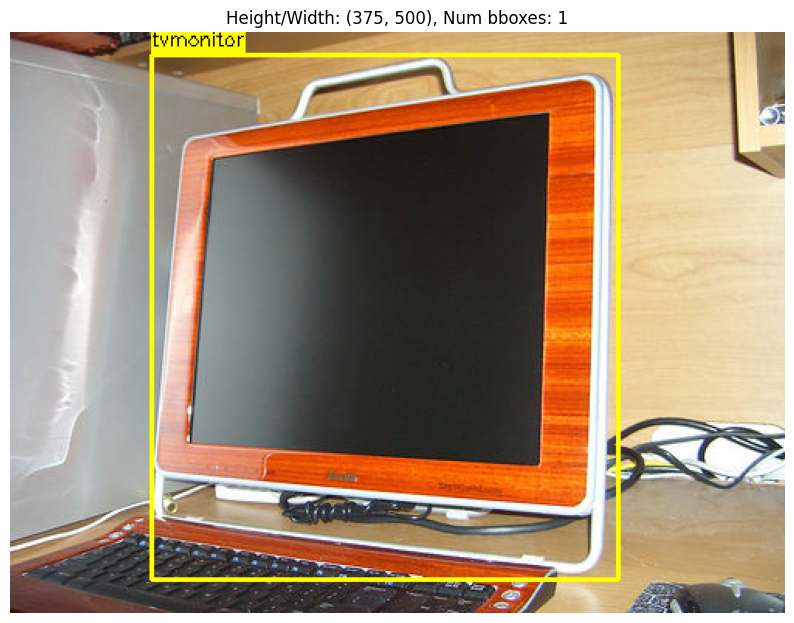

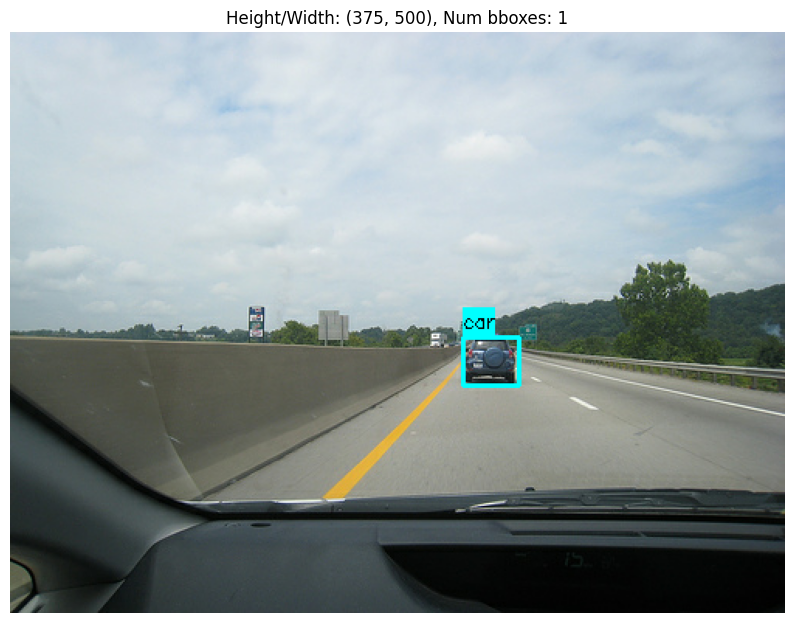

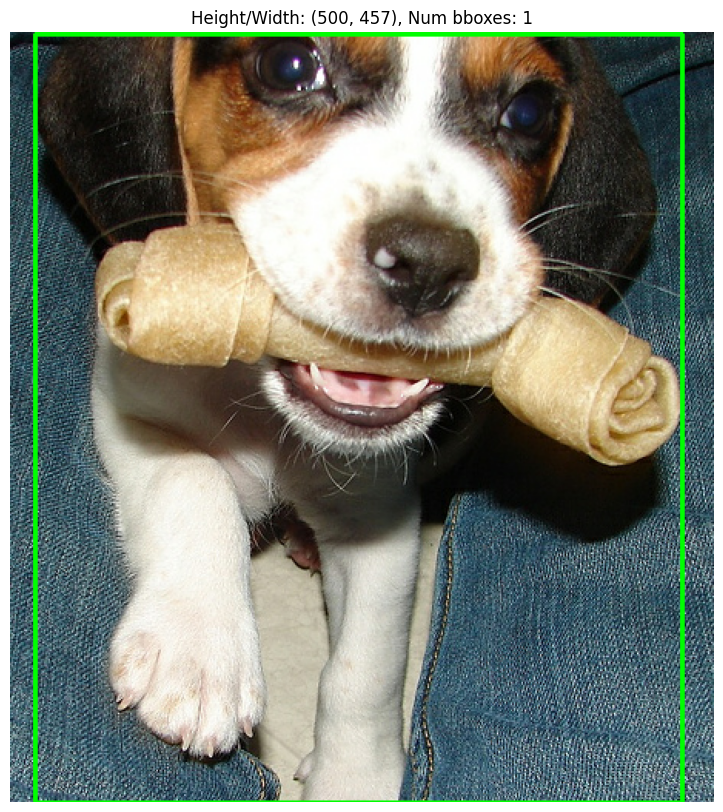

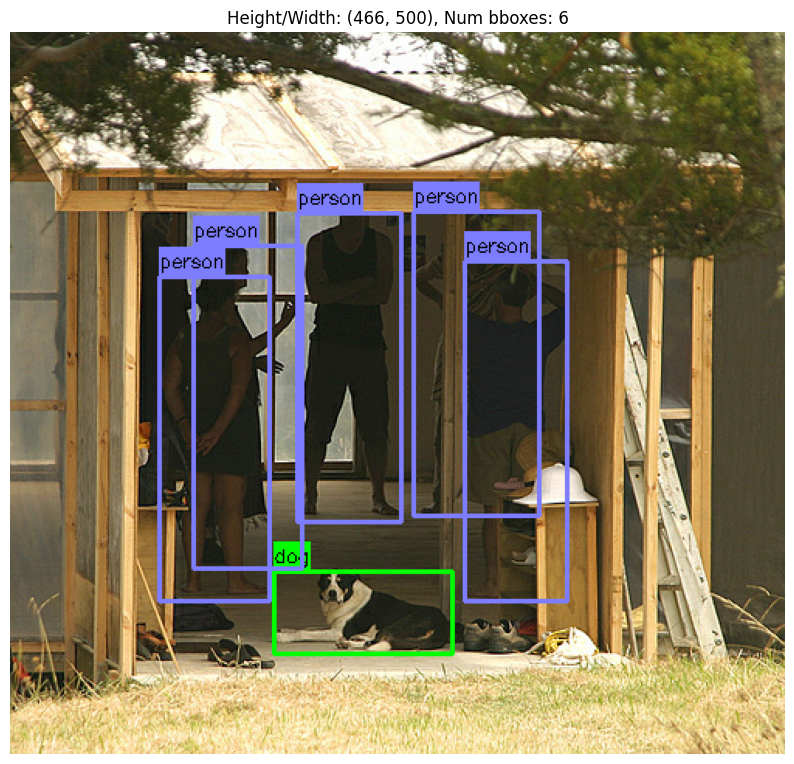

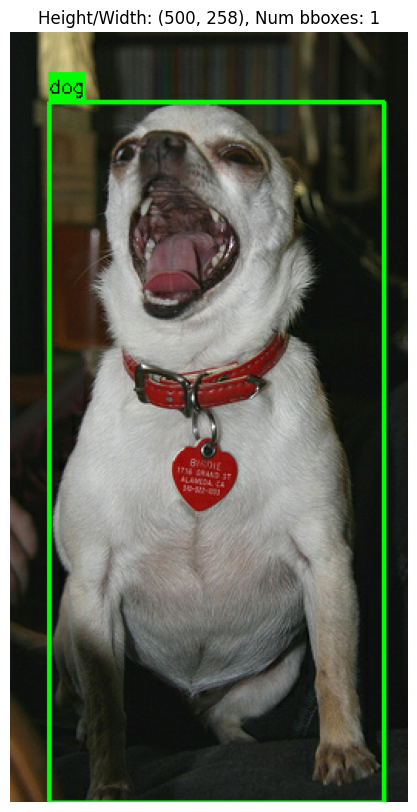

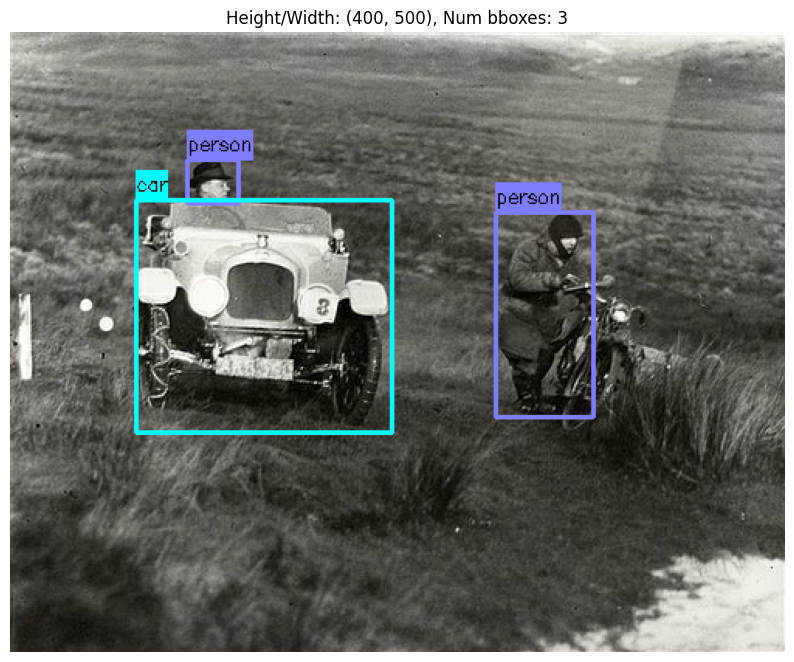

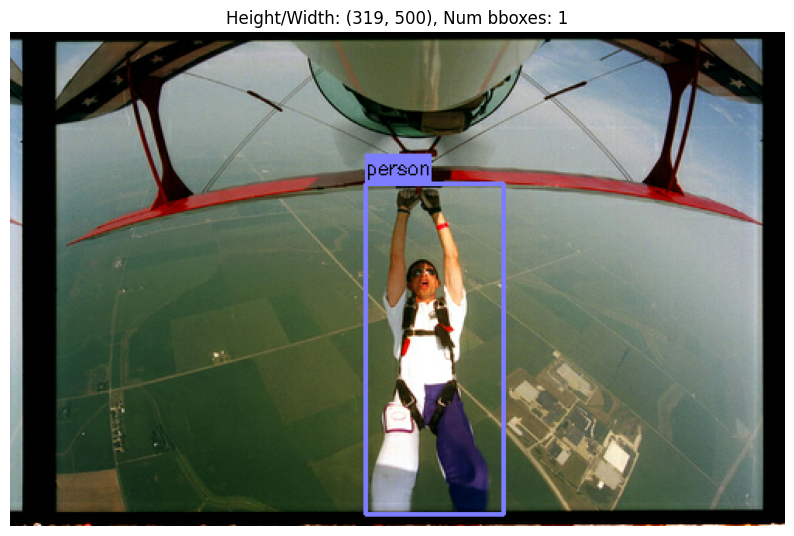

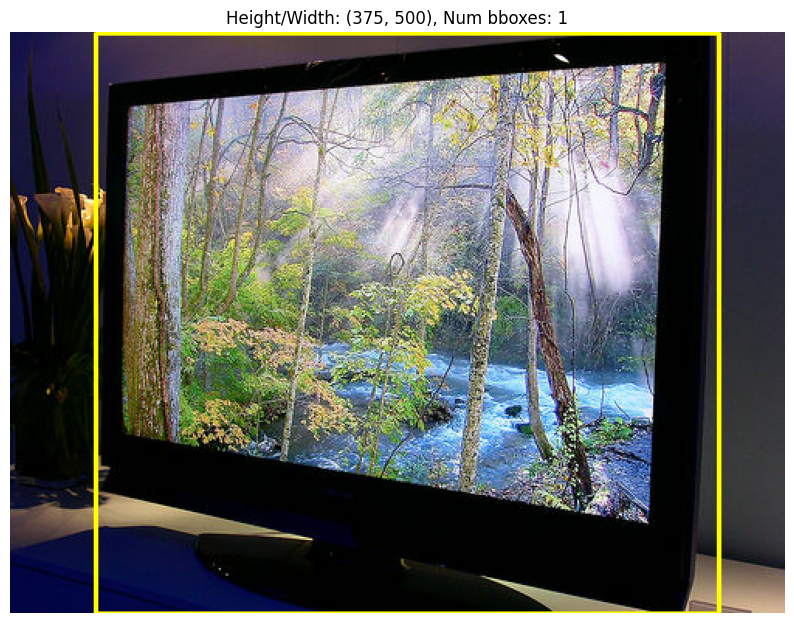

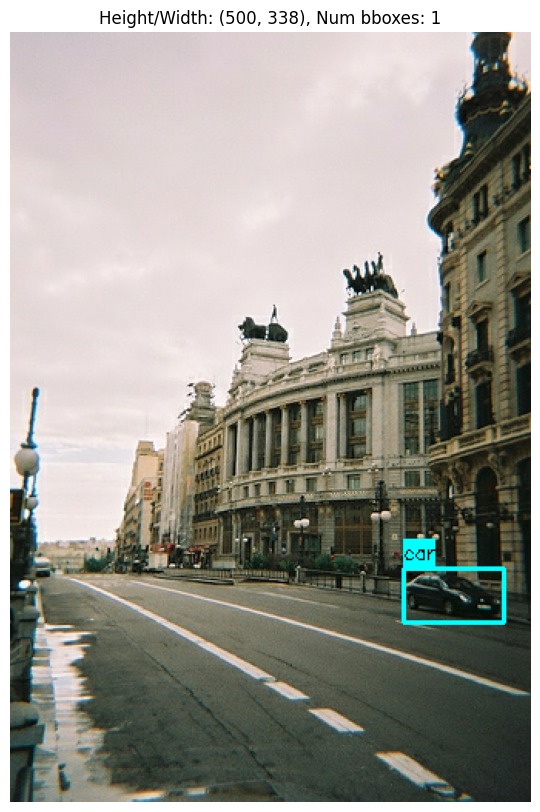

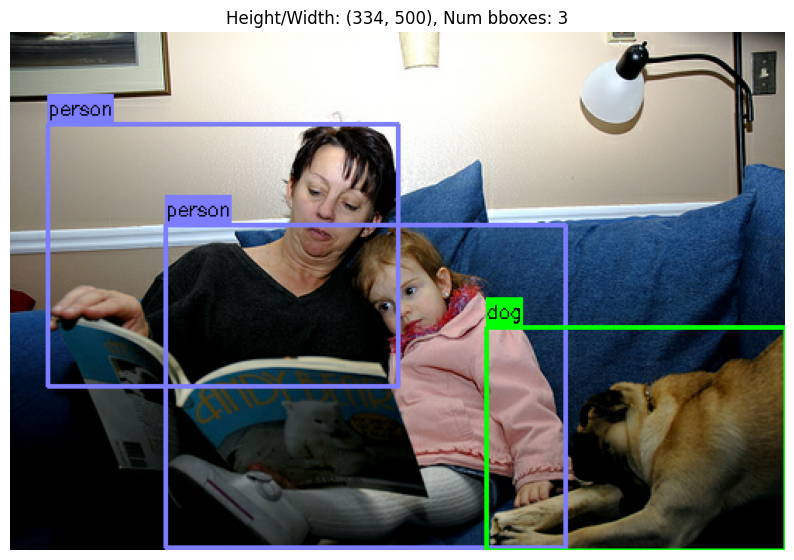

In [ ]:
# Create a class_labels dictionary same as the label map
class_labels =  {"car" : 1, "dog": 2, "person": 3, "tvmonitor": 4}


# We're Visualizing the train TF Record, you can also visualize the test record file.
data_path = "val_data.tfrecord"

# Call the view_records
view_records(data_path, class_labels)

## 6 Download and Train Faster RCNN (with ResNet101 as the feature extractor)

In this section we finally get to train a Deep Learning Model that is able to detect different kind of Vehicles. This involves a few simple steps:

* **Step 1: Download the Model**
* **Step 2: Configure the Model Parameters**
* **Step 3: Setup TensorBoard**
* **Step 4: Train the Model**

### 6.1 Download the Model

Download the Model from the official [TensorFlow Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md) repo. You can use any model you like, however, we're using a pretrained model **faster_rcnn_resnet101** model and would be finetuning it.

This download model function downloads any model from the zoo.

In [ ]:
# Function to Download any model from Model Zoo from their URL
def download_model(model_name, url):

    # Initialize the Downloader object of urllib
    opener  = urllib.request.URLopener()
    opener.retrieve(url, model_name+'.tar.gz')

    # Extract the Model
    tar = tarfile.open(model_name + '.tar.gz')
    tar.extractall(model_name)
    tar.close

Download the **Faster RCNN ResNet101** model by calling the function above.

In [ ]:
# Define URL and name of the Model
model_url = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet101_v1_640x640_coco17_tpu-8.tar.gz'
model_directory = 'Faster_RCNN_Resnet_101'

model_name = model_url.split('/')[-1].split('.')[0] # faster_rcnn_resnet101_v1_640x640_coco17_tpu-8

# Download FasterRCNN from the Model Zoo
download_model(model_directory, model_url)

<ipython-input-18-5bffd837279d>:8: DeprecationWarning: URLopener style of invoking requests is deprecated. Use newer urlopen functions/methods
  download_model(model_directory, model_url)


### 6.2 Configure the Model Parameters

Now we have to configure the model so it can train on our specified dataset like we want it to.

We already have a detailed discussion about the various config parameters of our pretrained model in the  **Pipeline Configuration in TFOD** notebook.


**Here's a brief description of each parameter we will change:**

- The number of classes.
- The batch size we are going to use.
- The path of our train and test TF Record Files.
- The path of the checkpoint file from the model we downloaded so we can utilize the pre-trained weights of the model for our problem.
- The training should be on GPU or TPU.
- The number of steps we want our model to train on.
- The path of the Labelmap of our data.

Define paths and parameters to change in the confiugration file

In [ ]:
# Paths of Train and Test TF Record Files
train_record_path = 'train_data.tfrecord'
test_record_path = 'val_data.tfrecord'

# Path of Label Map of the Dataset
labelmap_path = 'labelmap.pbtxt'

# Checkpoint File of the Pre-Trained model so we can use what the model has learned
fine_tune_checkpoint_path = os.path.join(model_directory, model_name, 'checkpoint', 'ckpt-0')

# Type of model of how we will use it
fine_tune_checkpoint_type = 'detection'

# Set Batch Size
batch_size = 5

# Set this to True only if using TPU for training
bfloat = False

# Number of Training Steps
num_steps = 20000
# Uncomment the below line if you want first to verify the training pipeline.
# num_steps = 1000

# Initial LR
initial_lr = 0.0003

# Path of the pipeline file we downloaded
base_config_path = os.path.join(model_directory, model_name, 'pipeline.config')

# Number of classes from Dataset
num_classes = 4

Now we will change the actual values to the ones we intialized above in the configuration file using `config_util` module.

In [ ]:
# Import the API's config_util file to read the config file and edit it
from object_detection.utils import config_util

We have provided a utility function `update_fine_tune_checkpoint_path` to update the path to our pre-trained model’s checkpoint.

In [ ]:
def update_fine_tune_checkpoint_path(train_config, checkpoint_path):
    """
    Args:
    train_config: train_pb2.TrainConfig object.
    checkpoint_path: path to pre-trained model’s checkpoint.
    """

    train_config.fine_tune_checkpoint = checkpoint_path

    return

The cell below has the utility function `update_fine_tune_checkpoint_type` to update the checkpoint type.

In [ ]:
def update_fine_tune_checkpoint_type(train_config, fine_tune_checkpoint_type):
    """
    Args:
    train_config: train_pb2.TrainConfig object.
    fine_tune_checkpoint_type: determines the type of weights that are restored from
                               from the pre-trained fine_tune_checkpoint.
                               Can be either of: "classification", "detection" or "full".
    """

    train_config.fine_tune_checkpoint_type = fine_tune_checkpoint_type

    return

In [ ]:
# Read the config file in the form a dictionary
configs = config_util.get_configs_from_pipeline_file(base_config_path)

# Update the Training TF Record file path
config_util.update_input_reader_config(configs,
                                       'train_input_config',
                                       'tf_record_input_reader',
                                       'input_path',
                                       train_record_path,
                                      )

# Update the Testing TF Record file path
config_util.update_input_reader_config(configs,
                                       'eval_input_config',
                                       'tf_record_input_reader',
                                       'input_path',
                                       test_record_path,
                                      )

# Update fine tune checkpoint path
update_fine_tune_checkpoint_path(configs['train_config'], fine_tune_checkpoint_path)

# Update fine tune checkpoint type
update_fine_tune_checkpoint_type(configs['train_config'], fine_tune_checkpoint_type)

# Update batch size
config_util._update_batch_size(configs, batch_size)

# Update Number of Steps
config_util._update_train_steps(configs, num_steps)

# Update Number of Classes
config_util._update_num_classes(configs['model'], num_classes)

# Update Label Map path
config_util._update_label_map_path(configs, labelmap_path)

# Update bfloat16 value
config_util._update_use_bfloat16(configs, bfloat)

# Update Initial LR
config_util._update_initial_learning_rate(configs, initial_lr)

# Create a pipeline file instance from the edited configuration instance
configs_file = config_util.create_pipeline_proto_from_configs(configs)

# Save the pipeline into a directory
config_util.save_pipeline_config(configs_file, './')

In [ ]:
# Directory where the Model's weights will be stored
# along with training logs during training.
model_dir = 'training_of_model'

### 6.3 Initialize Tensorboard

To visualize the training of our model through Tensorboard, we initialize it and point it towards the directory of the Model's Training. When the training starts, you might need to refresh Tensorboard by clicking the top right icon.

In [ ]:
# This loads tensorboad in the notebook
%load_ext tensorboard

# Magic command to launch tensorboard
%tensorboard --logdir {model_dir}

<IPython.core.display.Javascript object>

### 6.4 Train the Model

We can now start the training. All we have to do now is launch the `model_main_tf2.py` script present in `models/research/object_detection/` and pass in the the `pipeline.config` file and also the directory where the trained model's checkpoints will be saved.

In [ ]:
# Path of the new edited Pipeline Configuration File we will use
pipeline_config_path = 'pipeline.config'

In [ ]:
# Use the TFOD API Script to Initiate Training
!python ./models/research/object_detection/model_main_tf2.py \
  --pipeline_config_path={pipeline_config_path} \
  --model_dir={model_dir} \
  --alsologtostderr

2024-02-12 11:56:35.447941: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-02-12 11:56:38.170835: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0212 11:56:38.171946 140261820540032 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: None
I0212 11:56:38.195727 140261820540032 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0212 11:56:38.195901 140261820540032 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0212 11:56:38.378994 140261820540032 dep

### 6.5 Evaluate the Model

The TensorFlow Object Detection API supports a variety evaluation protocols which tell us how good our model is performing. The protocols are configured in the pipileine confing file by setting `metrics_set` to the protocl we want to use.

We will discuss some of the metrics here:

**PASCAL VOC 2010 Detection Metric:**

This detection metric computes the mAP(mean Average Precision) as the mean of per class average precisions. Precision is also call positive predicitive value. For example if there are two classes, **Cat** and **Dog**, and if the total number of boxes of cats are 10 times more than the dog, each of the two classes will contribute equally in calcualting the final mAP. We set it like this:
 `configs.metrics_set='pascal_voc_detection_metrics'`

**Weighted PASCAL VOC Detection Metric:**

This detection metric also computes the mAP but if use the same example as above, the final mAP value will be influenced by the frequency of each class. We set this Detection Metric as:

`configs.metrics_set='weighted_pascal_voc_detection_metrics'`

**COCO Detection Metric:**

This is the default detection metric used in the TensorFlow Object Detection API. This Metric is similar to both PASCAL VOC metrics, It just has a different implementation and report additional statistics such as mAP at IoU thresholds of .5 to .95, precision/recall statistics for small, medium and large objects. Its the default metrics but we can also set it as:

`configs.metrics_set='coco_detection_metrics'`

Now we will peform the actual Evaluation and see some interesting statistics about our model.

To know more about the other evaluation metrics that we can use, you can refer [here](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/evaluation_protocols.md)


For evaluation, the same python script `model_main_tf2.py` is used. Here, one has to provide checkpoint_dir for the model to evaluate.

If you are wondering what the use of model_dir here is, the directory will be used to save the logs (`tfevents`).

In [ ]:
!python ./models/research/object_detection/model_main_tf2.py \
  --model_dir {model_dir} \
  --pipeline_config_path {pipeline_config_path} \
  --checkpoint_dir {model_dir}

W0816 09:27:42.725397 139936221968256 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0816 09:27:42.725728 139936221968256 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0816 09:27:42.725880 139936221968256 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0816 09:27:42.726014 139936221968256 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0816 09:27:42.726199 139936221968256 model_lib_v2.py:1110] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2022-08-16 09:27:43.690250: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original confi

**The evaluation summary (the coco metric):**


```
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.596
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.868
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.666
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.174
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.501
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.691
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.473
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.674
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.689
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.600
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.774
```